## Final Project Submission

Please fill out:
* Student name: **Emily Pfeifer**
* Scheduled project review date/time: **3/8/2019 at 3:00 PM**
* Instructor name: **Brandon Lewis**
* Blog post URL: **https://pfeiferem.weebly.com/data-cleaning-kc-housing.html**


## Getting Started

Using my knowledge of data science, I am going to examine a dataset on houses in King County, WA. The dataset, which was retrieved from Kaggle, contains information about the price that each house sold for as well as a number of predictor variables. 

In [1]:
#importing the necessary libraries that we will be working with
import pandas as pd #pandas will help us with data manipulation and analysis
import numpy as np #numpy lets us quickly perform operations on numerical data
import seaborn as sns #seaborn is helpful with data visualization
import matplotlib.pyplot as plt #matplotlib will let us form useful plots
import folium #this will help us visualize our data on a map
#command that lets us view matplotlib plots in the jupyter notebook
%matplotlib inline 

In [2]:
df = pd.read_csv('kc_house_data.csv') #assigning our housing data to a pandas dataframe so that we can use it
df.head() #previewing the data/making sure that it was loaded correctly

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


In [3]:
df.info() #this function gives us a brief summary of the dataframe

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(11), object(2)
memory usage: 3.5+ MB


## Cleaning the Data

### Data Types

The first thing I want to do is clean the data, and I believe the best way to begin that process is to make sure that each column is encoded as the correct data type. I see that there are only two columns that are strings right now - date and sqft_basement. On first review, it makes sense that date is encoded as an object and I'll leave that be (for now). However, I think that Sqft_basement makes a lot more sense as an integer, so I will definitely take steps to convert it. I am also going to go ahead and encode zipcode as an object as it seems more like categorical data to me.

I suspect that the reason that sqft_basement was encoded as a string is because someone probably entered something other than  a number in one of the sqft_basement rows. Let's investigate.

In [4]:
df.sqft_basement.unique() #this function provides us with each unique value in a data set
#we should check to see if there was any data that was entered as a string before we convert the entire column
#otherwise we will get an error when we try to encode the column as an integer

array(['0.0', '400.0', '910.0', '1530.0', '?', '730.0', '1700.0', '300.0',
       '970.0', '760.0', '720.0', '700.0', '820.0', '780.0', '790.0',
       '330.0', '1620.0', '360.0', '588.0', '1510.0', '410.0', '990.0',
       '600.0', '560.0', '550.0', '1000.0', '1600.0', '500.0', '1040.0',
       '880.0', '1010.0', '240.0', '265.0', '290.0', '800.0', '540.0',
       '710.0', '840.0', '380.0', '770.0', '480.0', '570.0', '1490.0',
       '620.0', '1250.0', '1270.0', '120.0', '650.0', '180.0', '1130.0',
       '450.0', '1640.0', '1460.0', '1020.0', '1030.0', '750.0', '640.0',
       '1070.0', '490.0', '1310.0', '630.0', '2000.0', '390.0', '430.0',
       '850.0', '210.0', '1430.0', '1950.0', '440.0', '220.0', '1160.0',
       '860.0', '580.0', '2060.0', '1820.0', '1180.0', '200.0', '1150.0',
       '1200.0', '680.0', '530.0', '1450.0', '1170.0', '1080.0', '960.0',
       '280.0', '870.0', '1100.0', '460.0', '1400.0', '660.0', '1220.0',
       '900.0', '420.0', '1580.0', '1380.0', '475.0', 

In [5]:
df = df[df.sqft_basement != '?'] #dropping the rows that only have "?"

In [6]:
df['sqft_basement'] = df['sqft_basement'].astype("float") #actually converting the sqft_basement column from str to float

In [7]:
df['zipcode'] = df['zipcode'].astype('str') # Encoding zipcode as a string

In [8]:
df.dtypes #let's see the datatypes in our dataset to verify that our code worked

id                 int64
date              object
price            float64
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront       float64
view             float64
condition          int64
grade              int64
sqft_above         int64
sqft_basement    float64
yr_built           int64
yr_renovated     float64
zipcode           object
lat              float64
long             float64
sqft_living15      int64
sqft_lot15         int64
dtype: object

### Removing Null Data

Great, so sqft_basement is taken care of. Let's search for null values and figure out the best way to deal with them.

In [9]:
df.isna().sum() #This will return the total number of null values in each column

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2339
view               61
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3754
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

Wow. There are a lot of NaN values in our dataset relative to the size (21,000 homes) of the dataset as a whole, so dropping the rows that contain null value doesn't seem like an option as it would dramatically shrink the amount of data we have to work with. 

Let's take a look at the data and investigate the best way to deal with the null values in waterfront, yr_renovated, and view.

In [10]:
df.view.describe() #this fuction gives us summary statistics for the data

count    21082.000000
mean         0.233327
std          0.765066
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          4.000000
Name: view, dtype: float64

In [11]:
df.view = df.view.fillna(value=df.view.median()) #replacing all of the null values in the view column with the view median

In [12]:
df.waterfront.value_counts() #let's see how many properties are actually waterfront 

0.0    18662
1.0      142
Name: waterfront, dtype: int64

In [13]:
df.waterfront = df.waterfront.fillna(value=df.waterfront.median()) 

For both view and waterfront, the median in the data set was 0. Most houses in our data set have not been viewed and are not waterfront properties, so I felt comfortable replacing the NaN values in both columns with the median.

In [14]:
df.yr_renovated.describe() #getting summary statistics for the yr_renovated column

count    17389.000000
mean        82.991949
std        398.481819
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       2015.000000
Name: yr_renovated, dtype: float64

In [15]:
df.yr_renovated.value_counts()

0.0       16666
2014.0       69
2003.0       31
2013.0       31
2007.0       30
          ...  
1953.0        1
1944.0        1
1934.0        1
1971.0        1
1959.0        1
Name: yr_renovated, Length: 69, dtype: int64

It looks like of the 17389 people who gave provided non-null data on the year their house was renovated, less than 1000 people actually had their house renovated (I'm assuming that people who entered "0" for the year the house was renovated are claiming that their home was never renovated). I'm going to replace the null values in the yr_renovated column with the median for the data (which is 0) because it seems like a safe assumption that most people haven't had their homes renovated.

In [16]:
df.yr_renovated = df.yr_renovated.fillna(value=df.yr_renovated.median())

### Multicollinearity

Looks like the null data is gone! Let's use a heatmap to check for multicollinearity between our variables now. But first, I'm going to go ahead and drop our 'ID' column, as it does not provide any insight into what price a house will sell for.

In [17]:
df = df.drop(["id"], axis=1) #dropping the ID column from our dataset

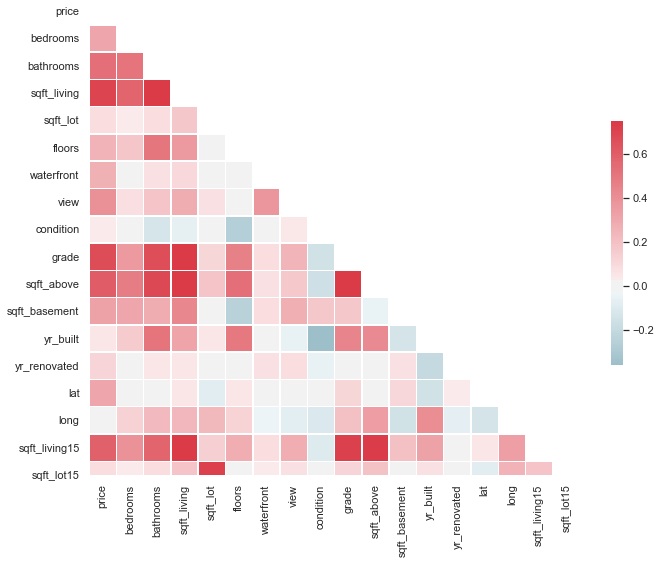

In [18]:
sns.set(style="white")
corr = df.corr() # making a covariance matrix

# Generate a mask the size of our covariance matrix
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.75, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

There could be a pretty high level of multicollinearity between some of these variables, just by looking at some of the dark patches on my heatmap. Let's look at table to see things more clearly.

In [19]:
abs(corr) > 0.75 #this provides a table displaying "true" where correlations between two variables are greater than .75

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15
price,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
bedrooms,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
bathrooms,False,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False
sqft_living,False,False,True,True,False,False,False,False,False,True,True,False,False,False,False,False,True,False
sqft_lot,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False
floors,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False
waterfront,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False
view,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False
condition,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False
grade,False,False,False,True,False,False,False,False,False,True,True,False,False,False,False,False,False,False


It looks like there's high multicolinearity between sqft_living and sqft_above, bathrooms, and sqft_living15, so I'm going to remove that sqft_living. Grade has multicollinearity with sqft_living (which we are dropping anyway) and sqft_above. I am going to remove grade from our dataset.

In [20]:
df.drop(['sqft_living'], axis=1, inplace=True) #dropping the sqft_living column and the grade column
df.drop(['grade'], axis=1, inplace=True)

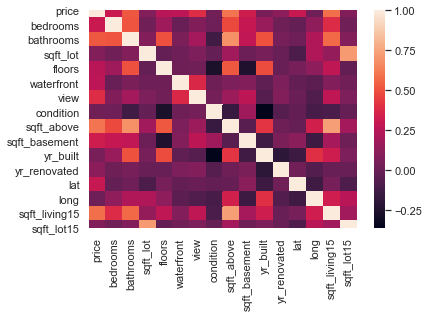

In [21]:
sns.heatmap(df.corr()) #just another heatmap to check our work

I do not see any huge problems in our heatmap, so that's taken care of.

### Outliers

In [22]:
df.describe() #I am going to scan the data for outliers 

,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15
count,2.114300e+04,21143.000000,21143.000000,2.114300e+04,21143.000000,21143.000000,21143.000000,21143.000000,21143.000000,21143.000000,21143.000000,21143.000000,21143.000000,21143.000000,21143.00000,21143.000000
mean,5.405107e+05,3.372558,2.116079,1.508714e+04,1.493591,0.006716,0.232654,3.409923,1789.069006,291.851724,1971.023223,68.256492,47.560274,-122.213876,1987.27139,12738.941967
std,3.680751e+05,0.924917,0.768531,4.120920e+04,0.539249,0.081679,0.764064,0.650498,828.409769,442.498337,29.321938,362.765827,0.138591,0.140597,685.67034,27169.273663
min,7.800000e+04,1.000000,0.500000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,370.000000,0.000000,1900.000000,0.000000,47.155900,-122.519000,399.00000,651.000000
25%,3.220000e+05,3.000000,1.750000,5.043000e+03,1.000000,0.000000,0.000000,3.000000,1200.000000,0.000000,1952.000000,0.000000,47.471250,-122.328000,1490.00000,5100.000000
50%,4.500000e+05,3.000000,2.250000,7.620000e+03,1.500000,0.000000,0.000000,3.000000,1560.000000,0.000000,1975.000000,0.000000,47.572000,-122.230000,1840.00000,7626.000000
75%,6.450000e+05,4.000000,2.500000,1.069550e+04,2.000000,0.000000,0.000000,4.000000,2210.000000,560.000000,1997.000000,0.000000,47.678200,-122.125000,2360.00000,10087.000000
max,7.700000e+06,33.000000,8.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,9410.000000,4820.000000,2015.000000,2015.000000,47.777600,-121.315000,6210.00000,871200.000000


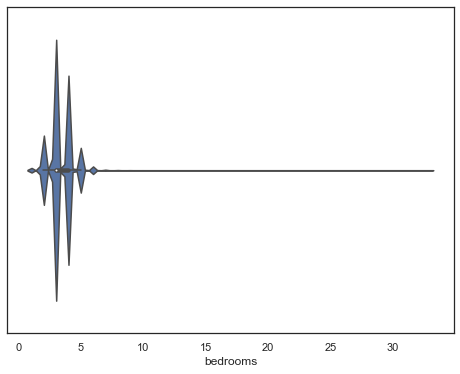

In [23]:
 #I thought it was strange that bedrooms went all the way to 30 on the x-axis of its histogram
plt.figure(figsize=(8,6))
sns.violinplot(df.bedrooms) #I'm going to look at a violin plot to look for outliers here

In [24]:
#let's look at the top ten highest value in bedrooms
df.bedrooms.sort_values(ascending = False).head() #that way we can see more exactly what our outliers are

15856    33
8748     11
15147    10
19239    10
13301    10
Name: bedrooms, dtype: int64

In [25]:
print(df.loc[[15856]]) #hmmm let's look at the rows that have 33 and 11 (respectively) in them...
print(df.loc[[8748]])

            date     price  bedrooms  bathrooms  sqft_lot  floors  waterfront  \
15856  6/25/2014  640000.0        33       1.75      6000     1.0         0.0   

       view  condition  sqft_above  sqft_basement  yr_built  yr_renovated  \
15856   0.0          5        1040          580.0      1947           0.0   

      zipcode      lat     long  sqft_living15  sqft_lot15  
15856   98103  47.6878 -122.331           1330        4700  
           date     price  bedrooms  bathrooms  sqft_lot  floors  waterfront  \
8748  8/21/2014  520000.0        11        3.0      4960     2.0         0.0   

      view  condition  sqft_above  sqft_basement  yr_built  yr_renovated  \
8748   0.0          3        2400          600.0      1918        1999.0   

     zipcode     lat     long  sqft_living15  sqft_lot15  
8748   98106  47.556 -122.363           1420        4960  


In [26]:
#judging by the data in those rows, I think the 33 and 11 were both just entered incorrectly
df = df[df.bedrooms <= 10] #for this reason, I'll be dropping both those rows

## Exploring Relationships in Our Data

### Relationships with our Zipcode data

Now that we have finished a few of the basic data-scrubbing procedures, let's start exploring some of the relationships in our data. There are a lot of different directions we could go in with this dataset, but I'm peronally curious about our zipcode data.

**Location is widely regarded to be one of the most important features of a house when determing its value, so I would specifically like to see if the zipcode a house is located in has an effect on the price of the house. Additionally, I am going to see if the number of houses sold differs from zipcode to zipcode**

To answer these questions, I am going to make a separate dataframe that is grouped by zipcode and find the average price of house for each zipcode. I will also generate a separate column to reflect the number of houses sold within each zipcode. I will then use a folium map to display the data.

In [27]:
# creating a new dataframe for my zipcode data
df_zipcode = df.groupby('zipcode').aggregate(np.mean)# get the mean value for each column
df_zipcode.reset_index(inplace = True) #resetting the index
df_zipcode.head() #let's see what this looks like

,zipcode,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15
0,98001,2.817962e+05,3.402266,2.020538,14834.577904,1.436261,0.000000,0.096317,3.334278,1728.742210,184.107649,1981.175637,22.558074,47.309118,-122.270745,1832.288952,11225.521246
1,98002,2.345127e+05,3.333333,1.843434,7505.853535,1.335859,0.000000,0.010101,3.742424,1524.166667,105.737374,1968.010101,50.176768,47.308779,-122.213374,1481.146465,7598.060606
2,98003,2.949962e+05,3.336996,2.043040,10629.216117,1.307692,0.000000,0.219780,3.377289,1662.267399,265.761905,1976.864469,14.630037,47.316058,-122.309963,1874.589744,9777.366300
3,98004,1.357423e+06,3.857143,2.527778,13121.066667,1.428571,0.003175,0.307937,3.495238,2418.444444,492.285714,1971.314286,177.793651,47.616229,-122.205251,2676.031746,12778.514286
4,98005,8.102914e+05,3.838323,2.422156,19991.233533,1.281437,0.000000,0.095808,3.694611,2160.077844,488.862275,1969.742515,47.916168,47.611627,-122.167204,2568.329341,18419.227545


In [28]:
# create a df for number of houses based on zipcode
df['count'] = 1 
count_zip = df.groupby('zipcode').sum()

count_zip.reset_index(inplace = True) 
count_zip = count_zip[['zipcode', 'count']] #eliminating everything but count and zip
df_zipcode = pd.merge(df_zipcode, count_zip, on='zipcode') #joining df_zipcode and count_zip on shared column (zipcode)

df.drop(['count'], axis = 1, inplace = True)# removing the count column from original dataset

In order to view our zipcodes on a map, we need the geoJson data. A quick google search of "King County, WA geojson" provided me with [this link](https://gis-kingcounty.opendata.arcgis.com/datasets/e6c555c6ae7542b2bdec92485892b6e6_113/data?geometry=-129.796%2C46.2%2C-113.108%2C48.797&orderBy=ZIPCODE&where=UPPER(COUNTY)%20like%20%27%25033%25%27). I was able to download the data as a kml file and then I used an online converter to convert the kml file into a geojson file. Although I have already explored my geojson file, I'm going to go ahead and preview it a bit within this notebook.

In [29]:
import json #importing json
f = open('Zipcodes_for_King_County_and_Surrounding_Area__zipcode_area.geojson') # opening the file
zip_geo = json.load(f) #loading the file

In [30]:
type(zip_geo) #what is the root data type?

dict

In [31]:
zip_geo.keys() #let's check the keys

dict_keys(['type', 'crs', 'features'])

In [32]:
zip_geo['type'] #invetsigating keys further

'FeatureCollection'

In [33]:
zip_geo['features'][0] #taking a look at the first entry in "features"

{'type': 'Feature',
 'properties': {'Name': None,
  'description': None,
  'OBJECTID': 1,
  'ZIP': 98031,
  'ZIPCODE': '98031',
  'COUNTY': '033',
  'ZIP_TYPE': 'Standard',
  'Shape_Length': 117508.232812751,
  'Shape_Area': 228012907.118483},
 'geometry': {'type': 'Polygon',
  'coordinates': [[[-122.21842289814009, 47.43750364721223],
    [-122.21896085950958, 47.43750323429727],
    [-122.21957512255675, 47.437502747190244],
    [-122.22159770557352, 47.43750114909897],
    [-122.22159948012721, 47.43495688707408],
    [-122.22170516190663, 47.43495715623222],
    [-122.22360892956898, 47.43496199332689],
    [-122.2237345700619, 47.434962098174005],
    [-122.22587769264129, 47.434963880129295],
    [-122.22612385149931, 47.43508413470761],
    [-122.22618863017513, 47.43511744881442],
    [-122.22628847456157, 47.43516579122701],
    [-122.22628861266344, 47.43516566614359],
    [-122.22648870370672, 47.43497890628139],
    [-122.22661341968615, 47.43486319440106],
    [-122.226718

Our geojson data loaded properly and looks as I expected it to. Our only obstacle now is that our dataset only had data for 70 zipcodes. Our geojson currently includes data for all 85 zipcodes in King County. We will now use a for loop to remove the zipcodes that are not in our dataset from our geojson file.

In [34]:
temp = zip_geo
finalzips = [] #creating a list to store our final zips
for i in range(len(temp['features'])):
    if temp['features'][i]['properties']['ZIPCODE'] in list(df_zipcode['zipcode'].unique()): #only zips included in both datasets!
        finalzips.append(temp['features'][i])
        

clean_json = dict.fromkeys(['type','features']) # making a separate json 
clean_json['type'] = 'FeatureCollection'
clean_json['features'] = finalzips

# save our new, cleaned json
open("final_geodata.json", "w").write(json.dumps(clean_json, sort_keys=True, indent=4, separators=(',', ': ')))

11576976

Perfect! Now let's display the relationships in question using folium's choropleth map function.

*Note: It is somewhat tricky to display the choropleth maps within our jupyter notebook. The choropleth maps for zipcode X price and zipcode x count can be found in the files list for this repo. For convenience, I have included screenshots of them in this notebook.*

For reference, here is a map of King County, WA with zipcode boundaries. 

![alt text](zip_boundary.png "Zipcode Boundaries")

In [35]:
# read cleaned geo data
king_geo = "final_geodata.json"

# Create Folium Map using the means of our lat and long variables 
m = folium.Map(location=[df['lat'].mean(), df['long'].mean()], zoom_start=9,
                   detect_retina=True, control_scale=False)

# Create choropleth map
folium.Choropleth(
    geo_data=king_geo,
    data=df_zipcode,
    columns=['zipcode', 'price'],
    key_on='feature.properties.ZIPCODE',
    fill_color='OrRd',
    fill_opacity=0.9,
    line_opacity=0.2,
    legend_name='zipcode + price'
    ).add_to(m)

folium.LayerControl().add_to(m)

m.save('zipcode_price.html') #save map as html file

m   #show map 

![alt text](zipcodeXpricepic.png "Zipcode Effect on Price")

In [36]:
folium.Choropleth(
    geo_data=king_geo,
    data=df_zipcode,
    columns=['zipcode', 'count'],
    key_on='feature.properties.ZIPCODE',
    fill_color='OrRd',
    fill_opacity=0.9,
    line_opacity=0.2,
    legend_name='zipcode + count'
    ).add_to(m)

folium.LayerControl().add_to(m)

m.save('zipcode_count.html') #save map as html file

m   #show map 

![alt text](zipcodeXcountpic.png "Zipcode Effect on Count")

Now we can answer the questions that we posed before! For price by zipcode, there are clearly some counties that have higher costing houses than others. It looks like zipcode 98039 is by far the most expensive area. The second and third most expensive, zipcodes 98004 and 98040, are directly to the right and directly under 98039, respectively. As you move further from Seattle's downtown area, the houses start costing less.

The relationship between count and zip is clearly there as well, as you can see a dynamic color range on the map. It looks like in particular, the zipcodes that sell the most houses are in the north east region of the county just under the border and the lower center of county around zipcodes 98042, 98038 and just above that, zipcode 98108. It looks like the further east you go in the county, the less houses are sold.


### Relationships with Our Date Column

I am also intrigued by our date data. I want to know whether or not the date that a house was sold has any effect on certain variables. I have a hunch that waterfront properties are worth more than their non-waterfront counterparts, but I am wondering if waterfront properties typically sell for more when the weather is nice. I'm also curious about whether or not people will be paying more for houses that they view depending on what time of year it is. I personally think that a large portion of what makes people spend money on houses is dependant on how well they can picture themselves being happy there. I am wondering if maybe people are thinking more about family during the winter months, which will maybe cause them to look at houses in a different way when they physically view them.

In [37]:
df['date'] = pd.to_datetime(df['date']) #convert date so that pandas knows it's a date, then we can do more with it

In [38]:
df['month'] = df['date'].dt.month #creating a separate column that just extracts the month from the original date column 
#I think the season is what we want to pay attention to, so I am not very concerned with day or year

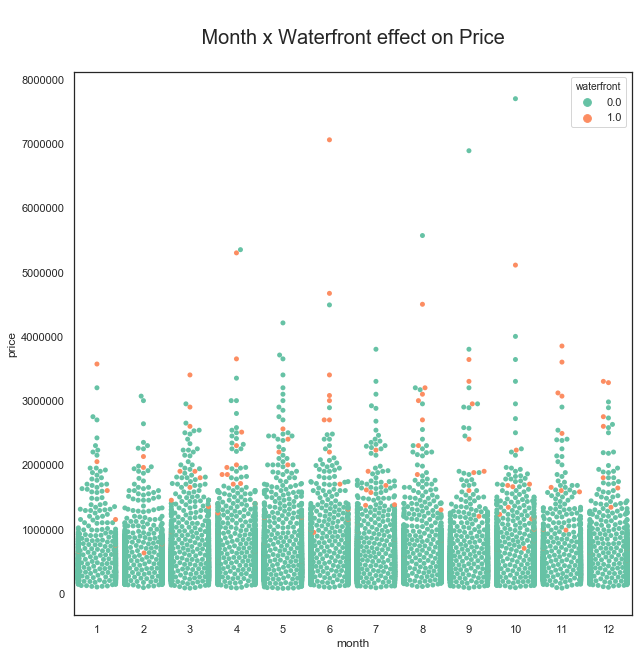

In [39]:
plt.figure(figsize=(10,10)) #making graph large enough to see
plt.title('\n Month x Waterfront effect on Price \n', fontsize=20) #adding a title
ax = sns.swarmplot(x="month", y="price", hue = "waterfront", data=df, palette="Set2") #defining what variables we want in our graph

It looks like waterfront properties do sell for more than houses that are not waterfront properties. As for the effect that weather has on waterfront properties and price, I am not seeing a huge trend that says waterfront properties will be sold for more when it's nice outside. However, I do see that the two minimum values that waterfront sold for were in February and October, and that the maximum value that a waterfront house sold for was in June, so perhaps it is worth exploring more in another dataset.

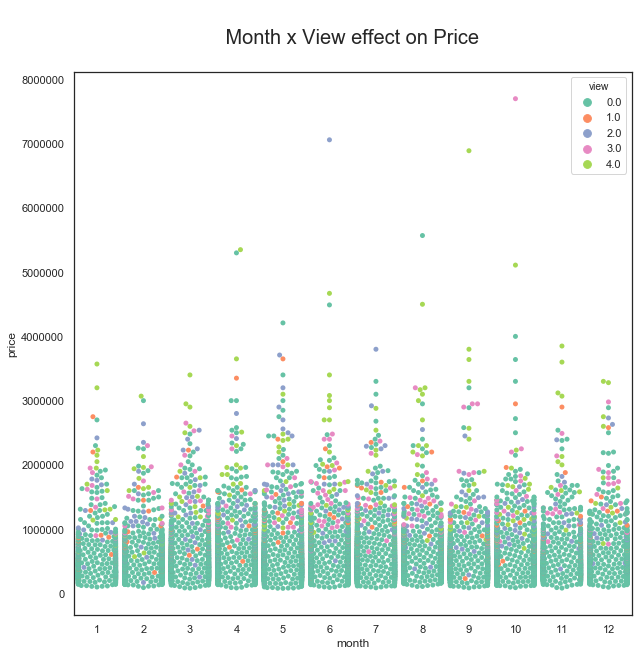

In [40]:
plt.figure(figsize=(10,10)) #making graph large enough to see
plt.title('\n Month x View effect on Price \n', fontsize=20) 
ax = sns.swarmplot(x="month", y="price", hue = "view", data=df, palette="Set2")

It looks as though the amount of times a house is viewed as well as how much it sells for is relatively even across the months, leading me to believe there is not a clear relationship between the weather and whether or not someone will be spending more money on a house that they have viewed. However, our 2 lowest selling houses that had been viewed were in our February and September and our few highest priced houses that had been viewed were mostly in the summer months, though the highest selling house that had been viewed was sold in October. There is not a huge amount of data for our view column so it is hard to make conclusions. On another note, it seems as though there's a positive correlation between the number of times a house is viewed and how much it sells for.

### Categorical Data

I'm going to split my dataframe in 2 parts to deal with the numerical data and the categorical data separately, since they each require different measures to be effectively cleaned.

I'm actually going to treat about half of the data as categorical. I'm binning view, yr_renovated, date and yr_built and then I will encode condition, waterfront and zipcode as objects. I'm binning this data because it feels more organized for some of categories to be further categorized, such as the date, which I would like to be broken down into seasons.

The general rule of thumb for what is categorical and what is numerical is that if it's a continous variable (such as lat, long, or square footage), it should be an integer. For our columns with more fixed data, such whether or not a house has a waterfront view or the times a house has been viewed, it will probably serve us better for the data to be categorical.

In [41]:
#creating 2 new dataframes from our existing dataframe, one for categorical data and the other for numerical data
df_cat = df[['month','view', 'condition', 'waterfront', 'yr_built', 'yr_renovated', 'zipcode']].copy()
df_num = df[['price', 'bathrooms', 'bedrooms','floors', 'sqft_lot', 'sqft_above', 'sqft_basement', 'lat', 'long', 'sqft_living15', 'sqft_lot15']].copy()

### Binned Categorical Variables

In [42]:
df_cat.month.unique() #checking to see the range of values in our data

array([10, 12,  2,  5,  1,  4,  3,  7,  8, 11,  6,  9], dtype=int64)

In [43]:
df_cat.month = df_cat.month.replace(12, 0) #replacing 12's with 0's so that it will be easier to bin the data into seasons
#this way, if December is coded as "0", I can say months 0-2 represent winter, 3-5 represent spring, etc.

In [44]:
df_cat.month.unique() #making sure I was sucessful in replacing the 12's with 0's

array([10,  0,  2,  5,  1,  4,  3,  7,  8, 11,  6,  9], dtype=int64)

In [45]:
#creating bins values to be organized by 
bins = [0, 3, 6, 9, 11]
# showing pandas which column we want to be binned, how many bins (defaults to one less than the # of bins we created, setting labels)
bins_date = pd.cut(df_cat['month'], bins, include_lowest = True, labels = ["winter", "spring", "summer", "fall"])
bins_date = bins_date.cat.as_unordered() 

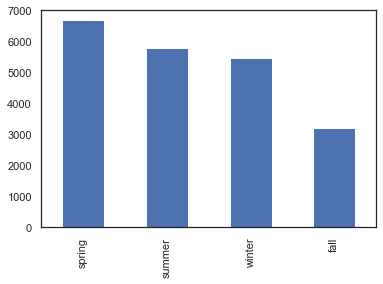

In [46]:
bins_date.value_counts().plot(kind='bar') #plotting a bar graph to preview these results

In [47]:
df_cat.view.value_counts() #now let's explore the view column!

0.0    19077
2.0      930
3.0      496
1.0      327
4.0      311
Name: view, dtype: int64

In [48]:
bins = [0, 1, 4] #repeating the binning process
#I will just split view into houses that were viewed and houses that were not viewed because the spread of our data is so zero-heavy
bins_view = pd.cut(df_cat['view'], bins, include_lowest = True, labels = ["not_viewed", "viewed"])
bins_view = bins_view.cat.as_unordered()

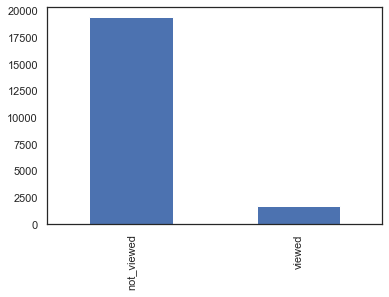

In [49]:
bins_view.value_counts().plot(kind='bar') #creating another handy dandy bar graph

In [50]:
df_cat.yr_built.describe() #I wanted to see just how spread apart our yr_built column was so I know how large to make the bins

count    21141.000000
mean      1971.026867
std         29.320592
min       1900.000000
25%       1952.000000
50%       1975.000000
75%       1997.000000
max       2015.000000
Name: yr_built, dtype: float64

In [51]:
bins = [1900, 1952, 1975, 1997, 2015] #Since we actually had a very even spread of data, I thought it would make most sense to bin it in quartiles
#I was tempted to use 1950 instead of 1952, but I thought it would be cleaner practice to follow the summary stats
bins_yr_built = pd.cut(df_cat['yr_built'], bins, include_lowest = True, labels = ("1900_thru_1951", "1952_thru_1974", "1975_thru_1996", "1997_thru_2015"))
bins_yr_built = bins_yr_built.cat.as_unordered()

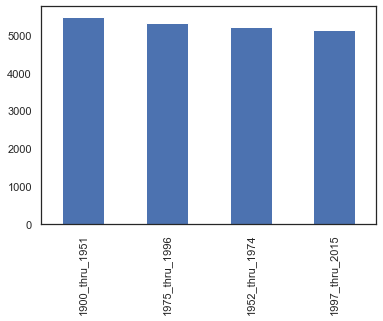

In [52]:
bins_yr_built.value_counts().plot(kind='bar')

In [53]:
df_cat.yr_renovated.describe() #finally, let's see what we can do with yr_renovated

count    21141.000000
mean        68.168393
std        362.539556
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       2015.000000
Name: yr_renovated, dtype: float64

In [54]:
bins = [0, 1, 2015] #I think it would make most sense to just bin these columns into renovated and not_renovated
#since it looks like the majority of our houses were not renovated
bins_yr_renovated = pd.cut(df_cat['yr_renovated'], bins, include_lowest = True, labels = ["not_renovated", "renovated"])
bins_yr_renovated = bins_yr_renovated.cat.as_unordered()

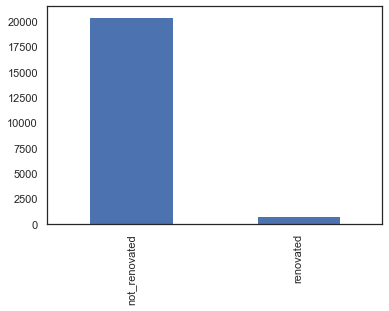

In [55]:
bins_yr_renovated.value_counts().plot(kind='bar')

### Remaining Categorical Variables

We have binned the data where it makes sense, now let's encode the rest of our catgeorical data as strings. Before we do that, I learned that our OLS regression does not like dealing with decimals in our categorical data. To fix this, I'm just going to quickly get rid of the decimals in a few columns.

In [56]:
#since condition and waterfront both only have whole numbers, I'm just going to get rid of the decimal by making them integers
#THEN I will encode them as strings
df_cat['condition'] = df_cat['condition'].astype("int") 
df_cat['waterfront'] = df_cat['waterfront'].astype("int")

In [57]:
#switching the remaining catogorical columns to objects so that we can one-hot encode them later
df_cat['condition'] = df_cat['condition'].astype("str") 
df_cat['waterfront'] = df_cat['waterfront'].astype("str")
df_cat['zipcode'] = df_cat['zipcode'].astype("str")

In [58]:
df_cat.info() #let's make sure everything is encoded properly

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21141 entries, 0 to 21596
Data columns (total 7 columns):
month           21141 non-null int64
view            21141 non-null float64
condition       21141 non-null object
waterfront      21141 non-null object
yr_built        21141 non-null int64
yr_renovated    21141 non-null float64
zipcode         21141 non-null object
dtypes: float64(2), int64(2), object(3)
memory usage: 1.3+ MB


Looks like we need to drop the original columns that we binned so that we can replace them with our binned data

In [59]:
df_cat = df_cat.drop(["view", "month", "yr_built", "yr_renovated"], axis=1) #removing our pre-binned columns
df_cat = pd.concat([df_cat, bins_date, bins_view, bins_yr_built, bins_yr_renovated], axis=1) #and replacing them with our binned columns

In [60]:
df_cat.info() #Let's make sure our binned columns are encoded as categories

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21141 entries, 0 to 21596
Data columns (total 7 columns):
condition       21141 non-null object
waterfront      21141 non-null object
zipcode         21141 non-null object
month           21141 non-null category
view            21141 non-null category
yr_built        21141 non-null category
yr_renovated    21141 non-null category
dtypes: category(4), object(3)
memory usage: 743.8+ KB


### One-Hot Encoding 

The final step in cleaning our categorical data is getting dummy variables from pandas. This is so we can deal with our categorical variables via one-hot ecoding.

In [61]:
df_cat = pd.get_dummies(df_cat) #one-hot encoding our data
df_cat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21141 entries, 0 to 21596
Data columns (total 89 columns):
condition_1                   21141 non-null uint8
condition_2                   21141 non-null uint8
condition_3                   21141 non-null uint8
condition_4                   21141 non-null uint8
condition_5                   21141 non-null uint8
waterfront_0                  21141 non-null uint8
waterfront_1                  21141 non-null uint8
zipcode_98001                 21141 non-null uint8
zipcode_98002                 21141 non-null uint8
zipcode_98003                 21141 non-null uint8
zipcode_98004                 21141 non-null uint8
zipcode_98005                 21141 non-null uint8
zipcode_98006                 21141 non-null uint8
zipcode_98007                 21141 non-null uint8
zipcode_98008                 21141 non-null uint8
zipcode_98010                 21141 non-null uint8
zipcode_98011                 21141 non-null uint8
zipcode_98014           

The categorical columns look as we expected them to.

Now it's time to clean our numerical data. We will start by normalizing everything. The most common way to do this is by converting our data into z-scores. We will accomplish this by taking each value in a column, subtracting the column's mean from it, and then dividing by the column's standard deviation.

To save us some work, we will use sklearn's built-in functions to test a few ways of normalizing our data, starting with standard scaling (mean normalization, as discussed above). 


### Mean Normalization

In [62]:
from sklearn.preprocessing import StandardScaler #importing StandardScaler
scaler = StandardScaler() #this is how we will reference StandardScaler
#creating a new dataframe of scaled data
df_scaled = pd.DataFrame(scaler.fit_transform(df_num),columns = df_num.columns) #fitting and transforming our data
#as well as making sure our column names carry over, otherwise our function will just return a numpy array

df_scaled.head() #let's check it out!

,price,bathrooms,bedrooms,floors,sqft_lot,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15
0,-0.865584,-1.452211,-0.411682,-0.915345,-0.229023,-0.735241,-0.659489,-0.354051,-0.306814,-0.944096,-0.260940
1,-0.006811,0.174291,-0.411682,0.939116,-0.190391,0.459830,0.244467,1.159746,-0.747799,-0.433639,-0.187734
2,-0.979417,-1.452211,-1.521946,-0.915345,-0.123466,-1.230169,-0.659489,1.281686,-0.136110,1.068562,-0.172165
3,0.172496,1.150191,0.698583,-0.915345,-0.244796,-0.892169,1.397011,-0.284783,-1.274136,-0.914927,-0.284864
4,-0.082881,-0.151010,-0.411682,-0.915345,-0.170057,-0.131670,-0.659489,0.407898,1.201071,-0.273210,-0.192739


Let's continue with our EDA.

**A few questions that we would like answered: 
What is more important to a home buyer, the size of the lot or the size of the house (sqft_above)? Do people appreciate more space inside or outside of their home?**


**What about bathrooms and bedrooms, which matters more to the consumer?**


**Are there any negative relationships in our data?**

**I'm also curious about comparing sqft_lot15 and sqft_living15...I could see sqft_lot15 being important because then people have more space between them and their neighbor, but I can also imagine that the size of surrouding houses could be important because it reflects a high value on the neighborhood.**

We'll start by just taking a quick look at the summary statistics for the dataset. This lets us get an idea of what we can expect from the data.

In [63]:
df_scaled.describe()

,price,bathrooms,bedrooms,floors,sqft_lot,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15
count,2.114100e+04,2.114100e+04,2.114100e+04,2.114100e+04,2.114100e+04,2.114100e+04,2.114100e+04,2.114100e+04,2.114100e+04,2.114100e+04,2.114100e+04
mean,-8.066329e-17,-5.377553e-17,-6.856379e-17,-4.302042e-17,6.721941e-18,-2.688776e-17,-4.839797e-17,2.023573e-14,7.380691e-15,-8.604084e-17,2.688776e-18
std,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00
min,-1.256529e+00,-2.102811e+00,-2.632211e+00,-9.153446e-01,-3.535070e-01,-1.713026e+00,-6.594892e-01,-2.917692e+00,-2.170332e+00,-2.316495e+00,-4.449310e-01
25%,-5.936349e-01,-4.763100e-01,-4.116818e-01,-9.153446e-01,-2.437522e-01,-7.110981e-01,-6.594892e-01,-6.426681e-01,-8.118131e-01,-7.253288e-01,-2.811831e-01
50%,-2.458874e-01,1.742905e-01,-4.116818e-01,1.188588e-02,-1.812190e-01,-2.765268e-01,-6.594892e-01,8.464696e-02,-1.147719e-01,-2.148721e-01,-1.882122e-01
75%,2.838843e-01,4.995908e-01,6.985829e-01,9.391163e-01,-1.065770e-01,5.081158e-01,6.060495e-01,8.509254e-01,6.320579e-01,5.435207e-01,-9.763375e-02
max,1.945075e+01,7.656196e+00,7.360171e+00,3.720808e+00,3.970561e+01,9.199541e+00,1.023318e+01,1.568139e+00,6.393317e+00,6.158544e+00,3.159611e+01


It's nice to have the actual numbers, but we could probably interpret the data a lot faster if we visualize it. Let's make some histograms to see how frequently each value in a column occurs.

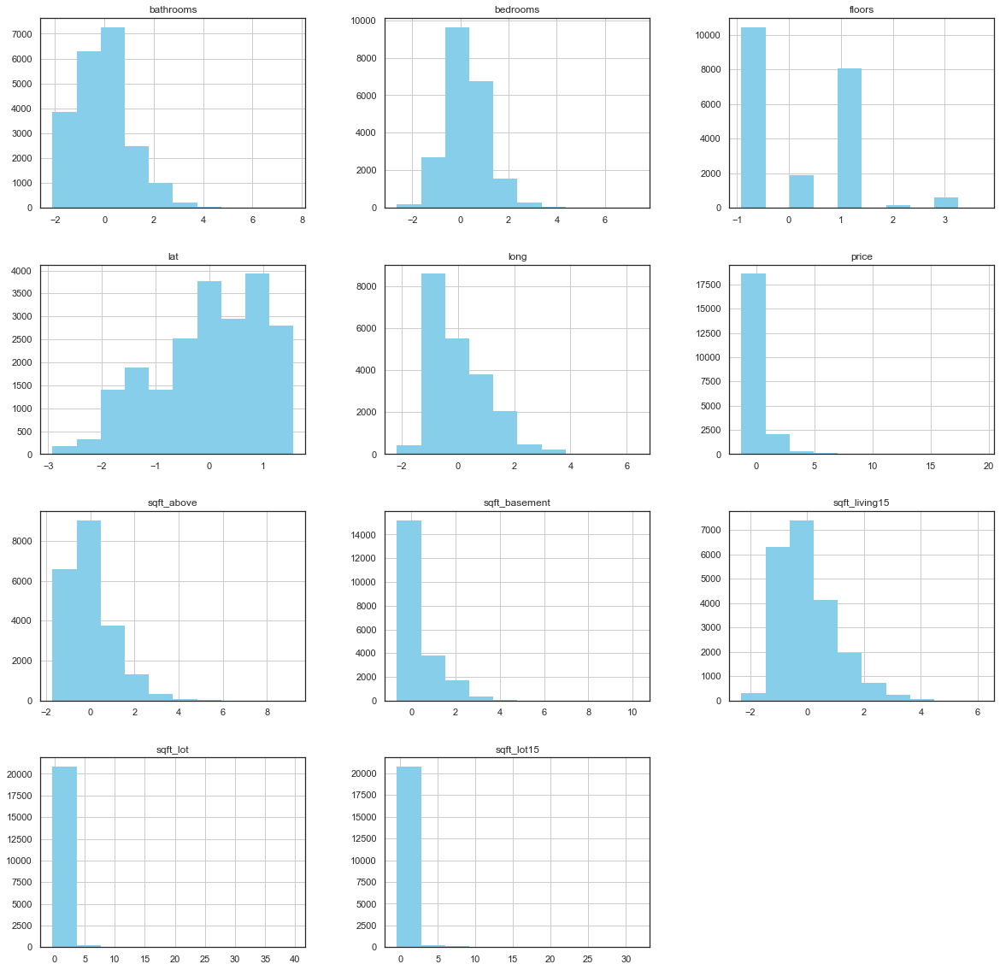

In [64]:
df_scaled.hist(figsize = (20,20), color = "skyblue", lw=0); #this function gives us histograms for each column

Bedrooms is very normal, which is good. It doesn't look like any of our other columns are really normally distributed, with the exception of sqft_livng15, sqft_above, bathrooms and long, which look closer to normal that the other plots, though they are still slightly positively skewed

Even so, I am seeing a lot of skewness and kurtosis among the histograms. A good amount of these plots are highly positively skewed -  sqft_lot, sqft_basement, floors, sqft_lot15, and price.

Interestingly, lat is the only plot that is negatively skewed.

To examine these distributions more throroughly, I'm going to lay a "Kernel Density Estimation" (KDE) plot on top of each histogram. But first, let's take a peak at what happens when we scale the data a different way. 

### Min-Max Normalization

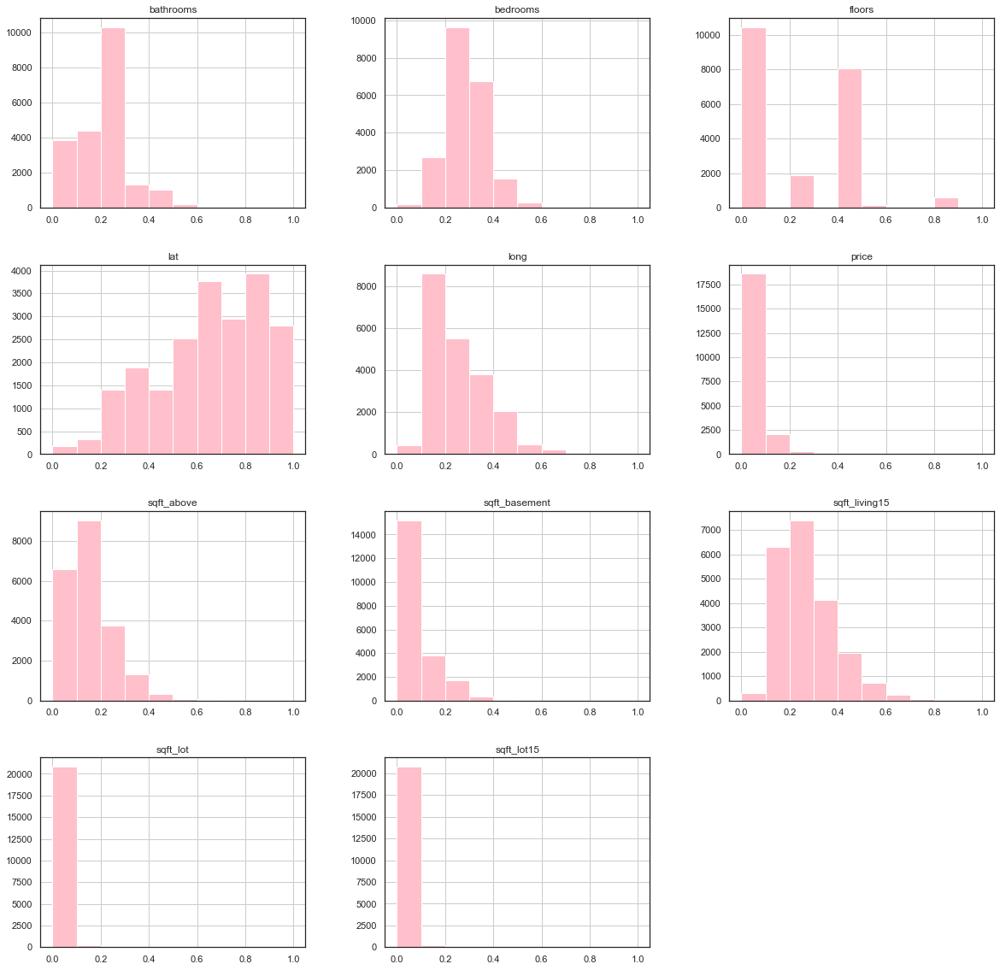

In [65]:
#let's just see how things change when we use a min-max scaler (normalization using y= (x-min)/(max-min))
from sklearn.preprocessing import MinMaxScaler #importing the MinMax Scaler
mmscaler = MinMaxScaler() #this is how we will reference said scaler
df_minmax = pd.DataFrame(mmscaler.fit_transform(df_num),columns = df_num.columns) 
df_minmax.hist(figsize = (20,20), color = "pink"); #let's make a histogram to compare

As you can see, the shape of the histograms look pretty similiar. The most obvious difference between our standard scaled data and our Min-Max scaled data is that the Min-Max contains only positive numbers. I can see from the plots above that unlike our standard scaled data, none of the values dip below zero. 

For the purposes of our experiment, I think that I will continue forward with the standard scaled data, as it is the most common way to scale data. 

While the shape of our plots is not completely ideal (or normal), the only variable I am really concerned about is price, because it is our target variable. I am going to keep the rest of the data mean normalized, but take a log transformation of price.

### Log Transformation

In [66]:
df_price_log= pd.DataFrame([]) #creating yet another dataframe to hold my numerical data
df_price_log = df_num

df_price_log['price']= np.log(df_price_log['price']) #performing a log transformation on price

#manually performing mean normalization on the rest of our varaibles
df_price_log['bathrooms']= (df_price_log['bathrooms'] - df_price_log['bathrooms'].mean())/df_price_log['bathrooms'].std()
df_price_log['bedrooms']= (df_price_log['bedrooms'] - df_price_log['bedrooms'].mean())/df_price_log['bedrooms'].std()
df_price_log['floors']= (df_price_log['floors'] - df_price_log['floors'].mean())/df_price_log['floors'].std()
df_price_log['sqft_lot']= (df_price_log['sqft_lot'] - df_price_log['sqft_lot'].mean())/df_price_log['sqft_lot'].std()
df_price_log['sqft_above']= (df_price_log['sqft_above'] - df_price_log['sqft_above'].mean())/df_price_log['sqft_above'].std()
df_price_log['sqft_basement']= (df_price_log['sqft_basement'] - df_price_log['sqft_basement'].mean())/df_price_log['sqft_basement'].std()
df_price_log['lat']= (df_price_log['lat'] - df_price_log['lat'].mean())/df_price_log['lat'].std()
df_price_log['long']= (df_price_log['long'] - df_price_log['long'].mean())/df_price_log['long'].std()
df_price_log['sqft_living15']= (df_price_log['sqft_living15'] - df_price_log['sqft_living15'].mean())/df_price_log['sqft_living15'].std()
df_price_log['sqft_lot15']= (df_price_log['sqft_lot15'] - df_price_log['sqft_lot15'].mean())/df_price_log['sqft_lot15'].std()

df_price_log.head()

,price,bathrooms,bedrooms,floors,sqft_lot,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15
0,12.309982,-1.452176,-0.411672,-0.915323,-0.229017,-0.735224,-0.659474,-0.354043,-0.306807,-0.944074,-0.260934
1,13.195614,0.174286,-0.411672,0.939094,-0.190387,0.459819,0.244461,1.159718,-0.747781,-0.433629,-0.187729
2,12.100712,-1.452176,-1.521910,-0.915323,-0.123463,-1.230140,-0.659474,1.281656,-0.136107,1.068537,-0.172161
3,13.311329,1.150164,0.698566,-0.915323,-0.244790,-0.892148,1.396978,-0.284776,-1.274106,-0.914905,-0.284857
4,13.142166,-0.151006,-0.411672,-0.915323,-0.170053,-0.131667,-0.659474,0.407888,1.201043,-0.273204,-0.192735


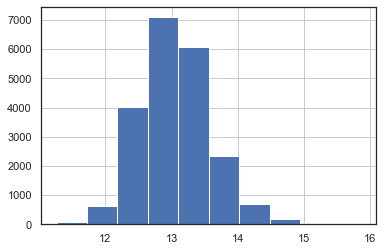

In [67]:
df_price_log['price'].hist() #let's just see how the shape of price changed

Wow, what a beautiful shape! df_price_log is the dataframe that speaks to me, so that's what I'm going to continue my EDA with.

### KDE Plots

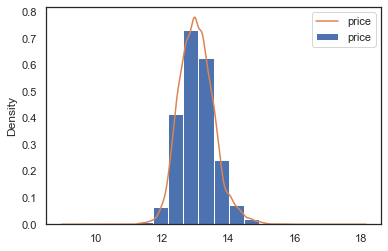

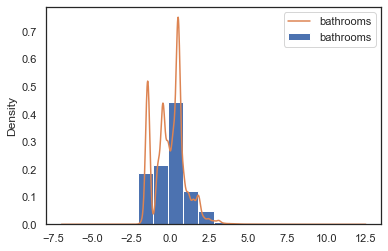

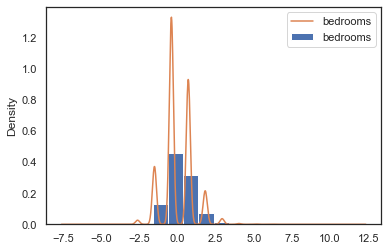

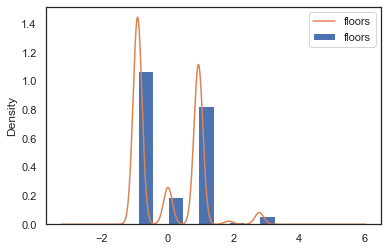

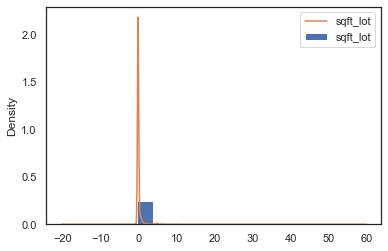

...

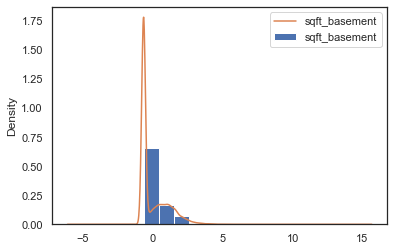

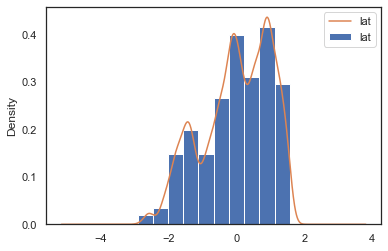

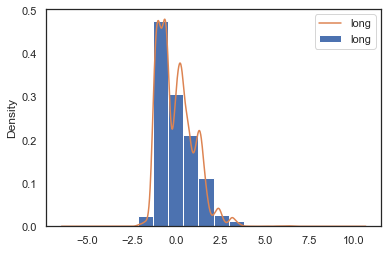

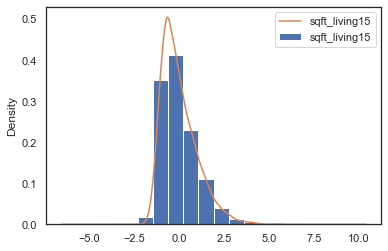

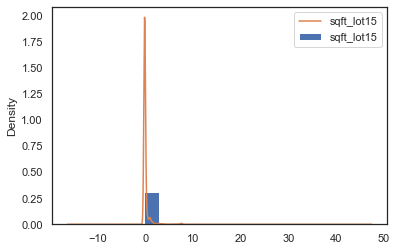

In [68]:
headers = list(df_price_log) #creating list of columns from our standard scaled data
#creating a for loop to iterate through our list of columns
for column in headers:
    df_price_log[column].plot.hist(density=True ) #creating a histogram
    df_price_log[column].plot.kde(label=column ) #creating a KDE plot
    plt.legend() #including a legend for each plot
    plt.show() 

The KDE plots make it easier to see how the data is distributed. Most of the data looks a little bit more normal with the KDE plot, like sqft_basement and long, so that's a plus. Bedrooms' shape also looks closer to normal. Thanks to our log transformation, price looks very normal. However, with some of the variables, such as bathrooms, it's showing higher peaks than I expected and less normality. It also looks like lat and floors almost border on being multimodal. 

Now let's use some joint plots to see the relationship between our predictors and our target variable. Our joint plots will let us see not only distributions and kde plots but also scatter plots and simple regression lines.

## Looking at Relationships in our Numerical Data

### Joint Plots

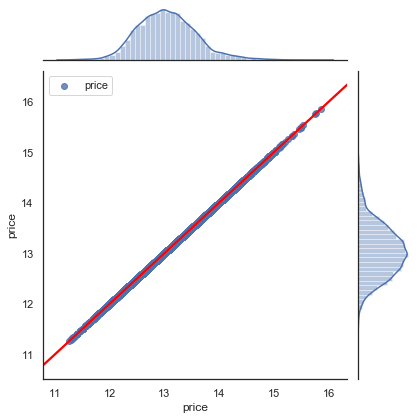

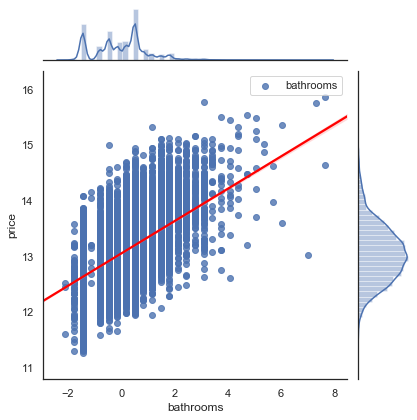

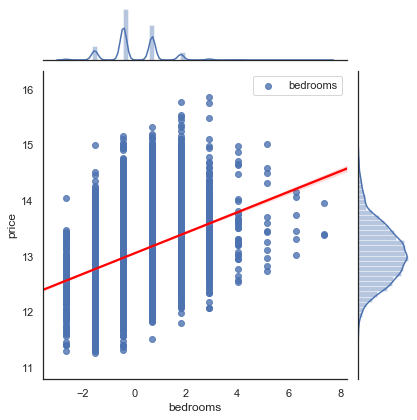

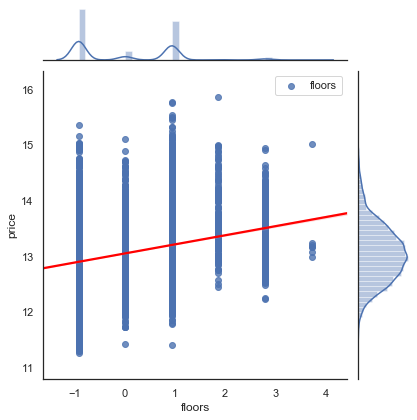

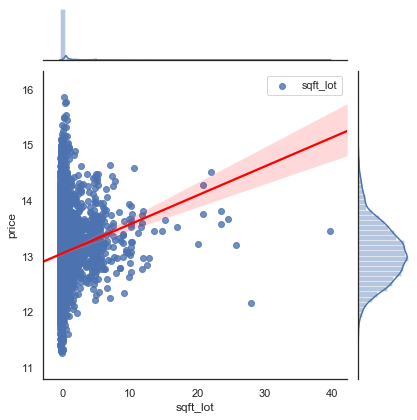

...

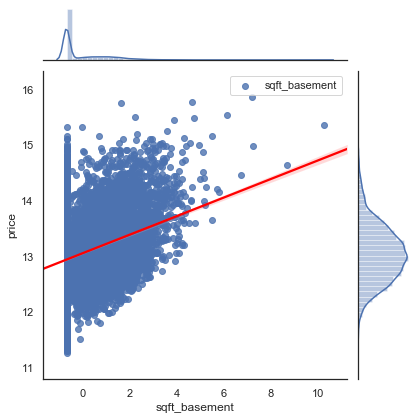

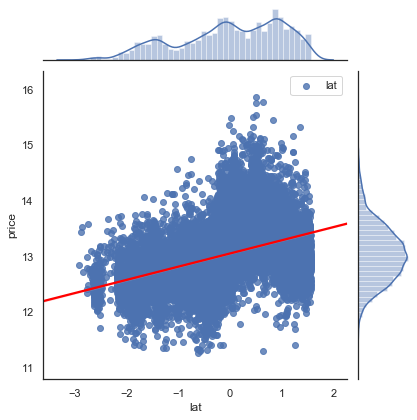

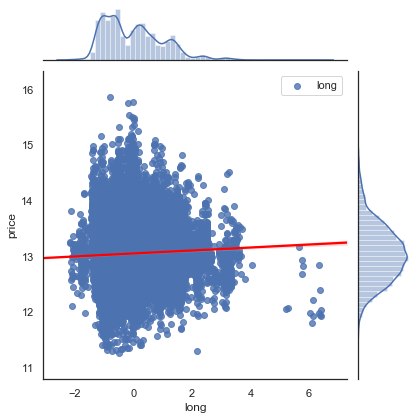

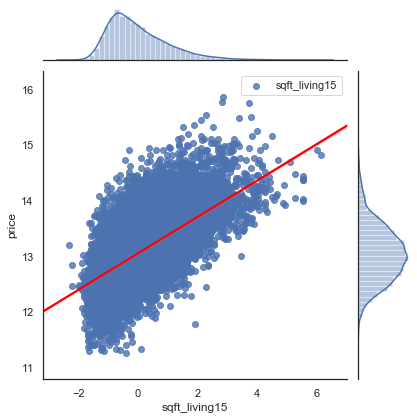

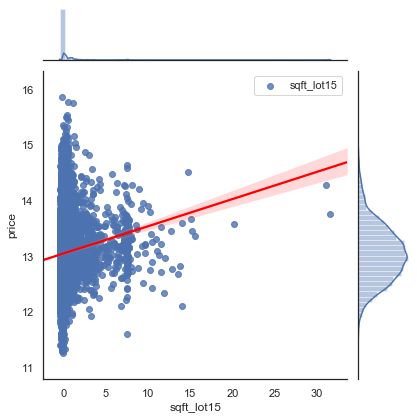

In [69]:
#once again just iterating through our list of columns so that we get each separate plot
for column in headers:
    sns.jointplot(x=column, y="price", #creating our joint plot as well as setting our columns to be predictors and price to be our target
                  data=df_price_log, #we want the jointplots to be created using our df_price_log dataset
                  kind='reg', 
                  label=column, 
                  joint_kws={'line_kws':{'color':'red'}}) #stylistic choices

    plt.legend() #including a legend for our plots
    plt.show()

There aren't too many surprises compared to the plots that we viewed earlier, however we are seeing some clear relationships between our predictors and target. Some of our data is not as normally distributed as we would like it to be, but we can see some other patterns that we have missed before. 

It looks like bathrooms, bedrooms, sqft_lot, sqft_basement, sqft_above, sqft_living15, sqft_lot15 have very strong positive relationships with price. This is the majority of our data, which is very exciting! 

Lat and floors have slighty weaker positive relationships with price, but it still looks somewhat promising.

There is an almost completely flat line in long, representing that there is no linear relationship with price.

**To answer the questions that we posed earier ---**

**What is more important to a home buyer, the size of the lot or the size of the house(sqft_above)?-- 
It looks like both of these predictors had decently sized positive relationships, but the slope was higher in sqft_above. It looks like the square footage of the living space is drives the price of a house up more than the size of the yard.**


**How about bathrooms versus bedrooms? ---
It's kind of hard to say which of these variables has a stronger relationship with price from the joint plot. They both look like they have clear positive relationships, but bathrooms looks a little stronger.**


**Are there any negative relationships in our data? ---
I did not notice any negative relationships, which is somewhat expected given that a great deal of our predictors have to do with size of the house or the lot. Every relationship between the predictors and the target is either upwards sloping or flat.**

**sqft_lot15 and sqft_living15, which is more important to the buyer? ---
Sqft_living15 appears to be more important than sqft_lot15.**

In [70]:
#I think we're ready to go ahead and add our categorical data to our numerical data
df_combo = pd.concat([df_price_log, df_cat], axis=1) #combining our cat data and num data
df_combo.head()

,price,bathrooms,bedrooms,floors,sqft_lot,sqft_above,sqft_basement,lat,long,sqft_living15,...,month_summer,month_fall,view_not_viewed,view_viewed,yr_built_1900_thru_1951,yr_built_1952_thru_1974,yr_built_1975_thru_1996,yr_built_1997_thru_2015,yr_renovated_not_renovated,yr_renovated_renovated
0,12.309982,-1.452176,-0.411672,-0.915323,-0.229017,-0.735224,-0.659474,-0.354043,-0.306807,-0.944074,...,0,1,1,0,0,1,0,0,1,0
1,13.195614,0.174286,-0.411672,0.939094,-0.190387,0.459819,0.244461,1.159718,-0.747781,-0.433629,...,0,0,1,0,1,0,0,0,0,1
2,12.100712,-1.452176,-1.521910,-0.915323,-0.123463,-1.230140,-0.659474,1.281656,-0.136107,1.068537,...,0,0,1,0,1,0,0,0,1,0
3,13.311329,1.150164,0.698566,-0.915323,-0.244790,-0.892148,1.396978,-0.284776,-1.274106,-0.914905,...,0,0,1,0,0,1,0,0,1,0
4,13.142166,-0.151006,-0.411672,-0.915323,-0.170053,-0.131667,-0.659474,0.407888,1.201043,-0.273204,...,0,0,1,0,0,0,1,0,1,0


In [71]:
df_combo.dtypes #let's make sure everything is still correctly encoded

price                         float64
bathrooms                     float64
bedrooms                      float64
floors                        float64
sqft_lot                      float64
                               ...   
yr_built_1952_thru_1974         uint8
yr_built_1975_thru_1996         uint8
yr_built_1997_thru_2015         uint8
yr_renovated_not_renovated      uint8
yr_renovated_renovated          uint8
Length: 100, dtype: object

In [72]:
#it looks like our categorical variables were converted to uint8, let's make sure they are categories!
for cat_names in df_combo.iloc[:,11:].columns:
         df_combo[cat_names] = df_combo[cat_names].astype('category')

## Modeling Our Data

### OLS Regression - Numerical Variables

Perfect. Now let's get started with modeling some of our data. We will be using the ordinary least squares (ols).

In [73]:
import statsmodels.api as sm #importing the necessary libraries
import statsmodels.formula.api as smf

col_names = df_combo.describe().columns[1:11] 

results = [['ind_var', 'r_squared', 'intercept', 'slope', 'p-value' ]] #creating an array to easily see the results we care about most
for idx, val in enumerate(col_names): #iterating through list of column names while also numbering them (that's the enumerate function)
    print("price~" + val) #labeling our results with their respective values
    f = 'price~' + val #building the formula
    model = smf.ols(formula=f, data=df_combo).fit() #fitting the line
    X_new = pd.DataFrame({val: [df_combo[val].min(), df_combo[val].max()]});# making a dataframe with the min and max values of our column
    preds = model.predict(X_new) #creating as well as storing our predictions
    results.append([val, model.rsquared, model.params[0], model.params[1], model.pvalues[1] ])#adding each value's data to our array
    print(results[idx+1]) #viewing our results
    print(model.summary()) #shows the regression diagnostics summary
    #while we are extracting a few elements of the table to view them more clearly, the model summary can provide a lot of useful information

price~bathrooms
['bathrooms', 0.30373623283912454, 13.048406301533227, 0.2902620391993196, 0.0]
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.304
Model:                            OLS   Adj. R-squared:                  0.304
Method:                 Least Squares   F-statistic:                     9222.
Date:                Fri, 01 Nov 2019   Prob (F-statistic):               0.00
Time:                        12:58:34   Log-Likelihood:                -12615.
No. Observations:               21141   AIC:                         2.523e+04
Df Residuals:                   21139   BIC:                         2.525e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
price~long
['long', 0.0025894494301578197, 13.048406301533227, 0.02680067041161978, 1.3289402767740573e-13]
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     54.88
Date:                Fri, 01 Nov 2019   Prob (F-statistic):           1.33e-13
Time:                        12:58:34   Log-Likelihood:                -16415.
No. Observations:               21141   AIC:                         3.283e+04
Df Residuals:                   21139   BIC:                         3.285e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
          

In [74]:
pd.DataFrame(results) #viewing our data in a neat little table

,0,1,2,3,4
0,ind_var,r_squared,intercept,slope,p-value
1,bathrooms,0.303736,13.0484,0.290262,0
2,bedrooms,0.123409,13.0484,0.185019,0
3,floors,0.0961882,13.0484,0.163344,0
4,sqft_lot,0.00979682,13.0484,0.0521296,3.54787e-47
5,sqft_above,0.361802,13.0484,0.316794,0
6,sqft_basement,0.100845,13.0484,0.167251,0
7,lat,0.20184,13.0484,0.236617,0
8,long,0.00258945,13.0484,0.0268007,1.32894e-13
9,sqft_living15,0.384891,13.0484,0.326746,0


In terms of r-squared, it looks like some of our values are pretty low. The highest ones are sqft_living15 with 0.385, sqft_above with 0.362,  bathrooms with 0.304, and lat with 0.202. Bedrooms comes in 5th 0.123 followed by sqft_basement with .101. The rest of the predictors have r-squared values smaller than 0.1. The smallest r-squared value is long with a value of 0.0025. The r-squared value is important because it tells us what percentage of the variance in our target variable (price) around its mean is explained by our model. 

All of the p-values are also very low (below .05, that is), which we appreciate because it shows that our results are significant.

The levels of skewness and kurtosis (anything above 1 or 3, respectively, is considered positively skewed/high) are not terrible. While most of the values have kurtosis hovering between 3 and 4, none of them go above 4 except for lat. Additionally, With the exception of lat, all of the values measuring skew are below .5. 

Overall, I am pretty content with our results. Let's look at our model overall.

In [75]:
formula = 'price ~ ' + ' + '.join(col_names) #defining our formula
mod = smf.ols(formula=formula, data = df_combo) #completing an OLS regression on our model overall
res = mod.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.691
Model:                            OLS   Adj. R-squared:                  0.690
Method:                 Least Squares   F-statistic:                     4715.
Date:                Fri, 01 Nov 2019   Prob (F-statistic):               0.00
Time:                        12:58:34   Log-Likelihood:                -4043.4
No. Observations:               21141   AIC:                             8109.
Df Residuals:                   21130   BIC:                             8196.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept        13.0484      0.002   6474.148      0.000      13.044      13.052
bathrooms         0.0392      0.003     11.418      0.000       0.032       0.046
bedrooms         -0.0309      0.003    -12.030      0.000      -0.036      -0.026
floors            0.0255      0.003      9.329      0.000       0.020       0.031
sqft_lot          0.0265      0.003      9.052      0.000       0.021       0.032
sqft_above        0.2200      0.004     53.584      0.000       0.212       0.228
sqft_basement     0.1256      0.003     45.885      0.000       0.120       0.131
lat               0.2073      0.002    100.328      0.000       0.203       0.211
long             -0.0579      0.002    -25.269      0.000      -0.062      -0.053
sqft_living15     0.1304      0.003     40.158      0.000       0.124       0.137
sqft_lot15       -0.0090      0.003     -3.064      0.002      -0.015      -0.003
==============================================================================
Omnibus:                      296.317   Durbin-Watson:                   2.006
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              542.003
Skew:                           0.058   Prob(JB):                    2.02e-118
Kurtosis:                       3.776   Cond. No.                         4.62
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

It looks like our r-squared overall for the numerical data is .69, which is not terrible. The difference between r-squared and r-squared adjusted is negligible. The skew is slight and the level of kurtosis is not perfect, but I am not too concerned about it. Let's now take a look at what our categorical data does.

### OLS Regression - Categorical Variables

In [76]:
#matching the data with their respective columns
#we have to drop one column from each variable to prevent singularity
 
cols_condition = df_combo.columns[11:15]
cols_waterfront = df_combo.columns[16:17]
cols_zipcode = df_combo.columns[18:87]
cols_season = df_combo.columns[88:91]
cols_view = df_combo.columns[92:93]
cols_yr_built = df_combo.columns[94:97]
cols_yr_renovated = df_combo.columns[98:99]

In [77]:
#time for our OLS regression!
cols = [cols_waterfront, cols_condition, cols_zipcode, cols_season, cols_view, cols_yr_built, cols_yr_renovated] #creating a list to iterate through
for col in cols: #creating a for loop
    sum_cols = "+".join(col) #adding each variable to our formula
    form = "price ~" + sum_cols #creating our formula
    model = smf.ols(formula= form, data= df_combo).fit() #fitting our model
    print(model.summary()) 

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.029
Model:                            OLS   Adj. R-squared:                  0.029
Method:                 Least Squares   F-statistic:                     634.1
Date:                Fri, 01 Nov 2019   Prob (F-statistic):          6.78e-138
Time:                        12:58:34   Log-Likelihood:                -16130.
No. Observations:               21141   AIC:                         3.226e+04
Df Residuals:                   21139   BIC:                         3.228e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept            14.1414      0.04

Well, those results are slightly disappointing. With the exception of zipcode and view, all of our categorical variables have r-squared values below .05. View has an r-squared value of .097. The one saving grace is that zipcode provides our best r-squared value yet, with a value of .531! Zipcode also has a very low p-value, demonstrating significance.

### Our Final Model

Based on the results, I think it is safe to eliminate a few predictors. We will now make a new dataframe that consists only of the predictors that had r2 values greater than or equal to .1. We will also be dropping a column from zipcodes and a column from view in our final model to prevent singularity.

In [78]:
#first I am creating a new dataframe called "df_final" that only has the columns that I want to keep.
#first dropping continuous variables
df_final = df_combo.drop(["sqft_lot","long","sqft_lot15"], axis=1)

In [79]:
df_final = df_final.drop(df_final.columns[8:15],axis=1) #dropping waterfront and condition columns

In [80]:
df_final = df_final.drop(df_final.columns[77:83],axis=1) #dropping season, 1 view column and 1 zipcode column

In [81]:
df_final = df_final.drop(df_final.columns[78:84],axis=1) #dropping yr_built and yr_renovated 

In [82]:
final_cols = df_final.drop(['price'],axis=1) #let's see what our final model looks like
formula = 'price ~ ' + ' + '.join(final_cols) 
mod = smf.ols(formula=formula, data = df_final) 
res = mod.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.851
Model:                            OLS   Adj. R-squared:                  0.850
Method:                 Least Squares   F-statistic:                     1558.
Date:                Fri, 01 Nov 2019   Prob (F-statistic):               0.00
Time:                        12:58:35   Log-Likelihood:                 3657.2
No. Observations:               21141   AIC:                            -7158.
Df Residuals:                   21063   BIC:                            -6538.
Df Model:                          77                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept             13.4019      0.014    983.718      0.000      13.375      13.429
zipcode_98001[T.1]    -0.7351      0.032    -23.169      0.000      -0.797      -0.673
zipcode_98002[T.1]    -0.7694      0.033    -23.178      0.000      -0.834      -0.704
zipcode_98003[T.1]    -0.7110      0.032    -22.367      0.000      -0.773      -0.649
zipcode_98004[T.1]     0.2518      0.017     15.104      0.000       0.219       0.284
zipcode_98005[T.1]    -0.0968      0.020     -4.856      0.000      -0.136      -0.058
zipcode_98006[T.1]    -0.1892      0.017    -11.378      0.000      -0.222      -0.157
zipcode_98007[T.1]    -0.1870      0.021     -8.861      0.000      -0.228      -0.146
zipcode_98008[T.1]    -0.1924      0.017    -11.245      0.000      -0.226      -0.159
zipcode_98010[T.1]    -0.4810      0.035    -13.818      0.000      -0.549      -0.413
zipcode_98011[T.1]    -0.5097      0.021    -24.667      0.000      -0.550      -0.469
zipcode_98014[T.1]    -0.5881      0.022    -26.834      0.000      -0.631      -0.545
zipcode_98019[T.1]    -0.6285      0.020    -31.074      0.000      -0.668      -0.589
zipcode_98022[T.1]    -0.6073      0.040    -15.337      0.000      -0.685      -0.530
zipcode_98023[T.1]    -0.7558      0.031    -24.178      0.000      -0.817      -0.695
zipcode_98024[T.1]    -0.4153      0.027    -15.517      0.000      -0.468      -0.363
zipcode_98027[T.1]    -0.3088      0.019    -16.640      0.000      -0.345      -0.272
zipcode_98028[T.1]    -0.5271      0.019    -27.788      0.000      -0.564      -0.490
zipcode_98029[T.1]    -0.2352      0.018    -13.077      0.000      -0.270      -0.200
zipcode_98030[T.1]    -0.7185      0.029    -25.199      0.000      -0.774      -0.663
zipcode_98031[T.1]    -0.6999      0.026    -26.754      0.000      -0.751      -0.649
zipcode_98032[T.1]    -0.7762      0.031    -24.953      0.000      -0.837      -0.715
zipcode_98033[T.1]    -0.1116      0.015     -7.212      0.000      -0.142      -0.081
zipcode_98034[T.1]    -0.3815      0.016    -24.288      0.000      -0.412      -0.351
zipcode_98038[T.1]    -0.6084      0.027    -22.765      0.000      -0.661      -0.556
zipcode_98039[T.1]     0.3775      0.032     11.928      0.000       0.315       0.440
zipcode_98040[T.1]     0.0677      0.018      3.668      0.000       0.032       0.104
zipcode_98042[T.1]    -0.6967      0.027    -25.673      0.000      -0.750      -0.644
zipcode_98045[T.1]    -0.4749      0.023    -20.627      0.000      -0.520      -0.430
zipcode_98052[T.1]    -0.2576      0.015    -17.467      0.000      -0.287      -0.229
zipcode_98053[T.1]    -0.3466      0.016    -21.828      0.000      -0.378      -0.315
zipcode_98055[T.1]    -0.6847      0.023    -29.741      0.000      -0.730      -0.640
zipcode_98056[T.1]    -0.5104      0.0

### Feature Ranking

Our model looks pretty good, I am very happy with our r2 value of .85. Let's still see if we can improve on it using feature ranking with recursive feature elimination. Feature ranking simply creates a subset of the most relevant features.

In [83]:
#creating a matrix with our predictor and target variables
y = df_final[["price"]] 
X = df_final.drop(["price"], axis=1) 
X.head()

,bathrooms,bedrooms,floors,sqft_above,sqft_basement,lat,sqft_living15,zipcode_98001,zipcode_98002,zipcode_98003,...,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,view_viewed
0,-1.452176,-0.411672,-0.915323,-0.735224,-0.659474,-0.354043,-0.944074,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1,0.174286,-0.411672,0.939094,0.459819,0.244461,1.159718,-0.433629,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,-1.452176,-1.521910,-0.915323,-1.230140,-0.659474,1.281656,1.068537,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1.150164,0.698566,-0.915323,-0.892148,1.396978,-0.284776,-0.914905,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,-0.151006,-0.411672,-0.915323,-0.131667,-0.659474,0.407888,-0.273204,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [84]:
#now we will commence feature ranking
from sklearn.feature_selection import RFE #first we are importing the necessary libraries
from sklearn.linear_model import LinearRegression
linreg = LinearRegression()

In [85]:
r_list = [] #creating lists to store r squared and r squared adjusted
adj_r_list = []
list_n = list(range(5,66,10)) #creating a loop where we find the 5 best features and then go up by increments of 10 until we have the 65 best features 
for n in list_n: 
    select_n = RFE(linreg, n_features_to_select = n) #selecting the pre-specified n most important features
    select_n = select_n.fit(X, np.ravel(y))
    selected_columns = X.columns[select_n.support_ ]
    linreg.fit(X[selected_columns],y)
    yhat = linreg.predict(X[selected_columns])
    SS_Residual = np.sum((y-yhat)**2) 
    SS_Total = np.sum((y-np.mean(y))**2)
    r_squared = 1 - (float(SS_Residual))/SS_Total
    print(r_squared)
    adjusted_r_squared = 1 - (1-r_squared)*(len(y)-1)/(len(y)-X.shape[1]-1)
    print(adjusted_r_squared)
r_list.append(r_squared)
adj_r_list.append(adjusted_r_squared)

price    0.145658
dtype: float64
price    0.142535
dtype: float64
price    0.356974
dtype: float64
price    0.354623
dtype: float64
price    0.46729
dtype: float64
price    0.465343
dtype: float64
price    0.513199
dtype: float64
price    0.511419
dtype: float64
price    0.778243
dtype: float64
price    0.777432
dtype: float64
price    0.795896
dtype: float64
price    0.79515
dtype: float64
price    0.847869
dtype: float64
price    0.847313
dtype: float64


There doesn't really seem to be a difference between our r2 values and our r2 adjusted values. Our r2 value overall is still .85. It also looks like our r-squared value is getting higher as we add more features, but by including 65 features we could be overfitting the line. We can test this using our test-train split.

### Test-Train Split

In [86]:
from sklearn.model_selection import train_test_split #importing necessary library
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=3) #defining our x and y train and test sets
#train size is .2, we are using a pretty standard 80/20 split on our test-train split
MSE_test = [] #mean of squared errors lists for both test and train sets
MSE_train = []
list_n = list(range(5,66,10))
for n in list_n: 
    select_n = RFE(linreg, n_features_to_select = n)
    select_n = select_n.fit(X_train, np.ravel(y_train))
    selected_columns = X.columns[select_n.support_ ]
    linreg.fit(X_train[selected_columns],y_train)
    yhat_train = linreg.predict(X_train[selected_columns])
    yhat_test = linreg.predict(X_test[selected_columns])
    mse_train = np.sum((y_train-yhat_train)**2)/len(y_train)
    mse_test =np.sum((y_test-yhat_test)**2)/len(y_test)
    print(mse_train)
    print(mse_test)
MSE_test.append(mse_test)
MSE_train.append(mse_train)

price    0.236874
dtype: float64
price    0.231401
dtype: float64
price    0.178582
dtype: float64
price    0.177611
dtype: float64
price    0.150098
dtype: float64
price    0.149783
dtype: float64
price    0.135429
dtype: float64
price    0.133667
dtype: float64
price    0.06157
dtype: float64
price    0.06142
dtype: float64
price    0.056856
dtype: float64
price    0.055827
dtype: float64
price    0.04255
dtype: float64
price    0.040939
dtype: float64


The mse for both the train and test set improve as we increase the number of variables. There is not a huge difference between the two, which is the expected result of this experiment.

We will now move on to 10-fold cross validation.


### K-Fold Cross Validation

In [87]:
from sklearn.metrics import mean_squared_error #importing the necessary libaries
from sklearn.model_selection import cross_val_score

select_65 = RFE(linreg, n_features_to_select = 65) #using our 65 favorite features
select_65 = select_n.fit(X, np.ravel(y))
selected_columns = X.columns[select_n.support_] 

cv_10_results = cross_val_score(linreg, X[selected_columns], y, cv=10, scoring="neg_mean_squared_error")

cv_10_results

array([-0.04290336, -0.0480334 , -0.04367788, -0.04119557, -0.04009341,
       -0.04474789, -0.04205438, -0.04325473, -0.04294287, -0.03660456])

It looks like our negative MSE values are pretty small, which is good! That means that there is not a high level of error in our data.

In [88]:
print(selected_columns) #let's see which features landed in our top 65

Index(['sqft_above', 'sqft_basement', 'sqft_living15', 'zipcode_98001',
       'zipcode_98002', 'zipcode_98003', 'zipcode_98004', 'zipcode_98006',
       'zipcode_98007', 'zipcode_98008', 'zipcode_98010', 'zipcode_98011',
       'zipcode_98014', 'zipcode_98019', 'zipcode_98022', 'zipcode_98023',
       'zipcode_98024', 'zipcode_98027', 'zipcode_98028', 'zipcode_98029',
       'zipcode_98030', 'zipcode_98031', 'zipcode_98032', 'zipcode_98034',
       'zipcode_98038', 'zipcode_98039', 'zipcode_98040', 'zipcode_98042',
       'zipcode_98045', 'zipcode_98052', 'zipcode_98053', 'zipcode_98055',
       'zipcode_98056', 'zipcode_98058', 'zipcode_98059', 'zipcode_98065',
       'zipcode_98070', 'zipcode_98072', 'zipcode_98074', 'zipcode_98075',
       'zipcode_98077', 'zipcode_98092', 'zipcode_98102', 'zipcode_98105',
       'zipcode_98106', 'zipcode_98108', 'zipcode_98109', 'zipcode_98112',
       'zipcode_98118', 'zipcode_98119', 'zipcode_98125', 'zipcode_98126',
       'zipcode_98133', 'zip

Interesting. It looks like RFE removed bedrooms, bathrooms, floors, lat, and a few of our zipcode columns. 

## Conclusion

*Our final model only includes the predictor variables that had r2 values of .1 or higher

*The final predictors were sqft_living15 with an r2 value of 0.385, sqft_above with 0.362, bathrooms with 0.304, lat with 0.202, bedrooms with 0.123, sqft_basement with .101, and zipcode with .531. Floors and view both had r2 values of .097 which I rounded up to .1. 

*All of our predictors are statistically significant with p-values smaller than .05

*Our r-squared value overall was .85

### A Special Thank You to the OSEMN Framework

The OSEMN framework really guided me through this project. Obtaining and loading the data was not too tricky as I did not have to collect the data myself or even upload the data from a relational database. The data was provided in a csv file from Kaggle.  My first real step was scrubbing the data, which I made sure to do through a thoughtful checklist. I was careful to make sure all of the data was encoded as the correct data type, I checked for and eliminated my NaN values, fixed the multicollinearity issues, removed a few pesky outliers, and made sure to standardize my numerical data before performing the exploratory data analysis.Through EDA, I used histograms, KDE plots, and joint plots to explore my data and check for normality and linearity assumptions. 

 EDA was especially important in examining relationships in my data that I would not be able to determine just from looking at the data. It was perhaps most important in my analysis of the zipcode variable, which I was able to find trends in using folium maps. I was also able to see the relationship between many of my categorical variables using boxplots. Next came modeling the data, which is the step in my process in which I began to truly identify my predictor and target variables. I used Ordinary Least Squares to model the r-squared value, the p-value, and the parameters of my data, which granted me important information on the exact effect size that my predictor variables had on the price of a house. After I modeled the data, I performed holdout validation techniques to see just how well my model could predict future data. I used feature ranking, a test-train-split, and K-Fold cross validation to examine my model's power. My final step was interpreting the data. I made sure to interpret the data in a way that was clear, concise, and relevant to my target audience, which consisted of a potential home seller.